In [ ]:
#OPtion1 
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2022-02-21 06:52:30--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2022-02-21 06:52:30 ERROR 404: Not Found.

bash: install_colab.sh: No such file or directory


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
##OPtion2 
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh --header "Referer: www.raw.githubusercontent.com"
!bash icevision_install.sh

--2022-02-21 07:12:30--  https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2691 (2.6K) [text/plain]
Saving to: ‘icevision_install.sh’

icevision_install.s 100%[===================>]   2.63K  --.-KB/s    in 0s      

2022-02-21 07:12:30 (39.3 MB/s) - ‘icevision_install.sh’ saved [2691/2691]

Coud not install icevision. Check out which torch and torchvision versions are compatible with your CUDA version


In [ ]:
## OPtion 3
!pip install icevision[all]

     |████████████████████████████████| 262 kB 5.2 MB/s 
     |████████████████████████████████| 49 kB 4.0 MB/s 
     |████████████████████████████████| 798 kB 41.4 MB/s 
     |████████████████████████████████| 98 kB 6.1 MB/s 
     |████████████████████████████████| 55 kB 3.1 MB/s 
     |████████████████████████████████| 111 kB 50.4 MB/s 
     |████████████████████████████████| 58 kB 4.7 MB/s 
     |████████████████████████████████| 79 kB 5.7 MB/s 
     |████████████████████████████████| 3.1 MB 48.6 MB/s 
     |████████████████████████████████| 1.7 MB 41.2 MB/s 
     |████████████████████████████████| 189 kB 57.0 MB/s 
     |████████████████████████████████| 527 kB 54.3 MB/s 
     |████████████████████████████████| 47.8 MB 2.0 MB/s 
     |████████████████████████████████| 74 kB 3.3 MB/s 
     |████████████████████████████████| 431 kB 44.3 MB/s 
     |████████████████████████████████| 596 kB 56.0 MB/s 
     |████████████████████████████████| 112 kB 49.7 MB/s 
     |█████████████████████

In [ ]:
### IMPORT 

from icevision.all import *




In [ ]:
# Clone 

!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

Cloning into 'PlantDoc-Object-Detection-Dataset'...
remote: Enumerating objects: 5196, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 5196 (delta 2), reused 5 (delta 2), pack-reused 5190
Receiving objects: 100% (5196/5196), 941.89 MiB | 37.45 MiB/s, done.
Resolving deltas: 100% (2330/2330), done.
Checking out files: 100% (5200/5200), done.


In [ ]:
# change Directory 
%cd PlantDoc-Object-Detection-Dataset/

/content/PlantDoc-Object-Detection-Dataset


In [ ]:
##Quick data exploration

import pandas as pd

annot=pd.read_csv("/content/PlantDoc-Object-Detection-Dataset/train_labels.csv")
annot.rename(columns={'class':'label'},inplace=True)
annot.sample(5)

,filename,width,height,label,xmin,ymin,xmax,ymax
5696,grape+leaves.JPG.jpg,1440,1080,grape leaf,446,29,892,490
3335,Late-blight.jpg,2272,1704,Potato leaf late blight,277,129,1604,1226
2912,potato-late-blight-symptom-on-leaves-PGB5NJ.jpg,1300,956,Potato leaf late blight,817,385,1056,659
5838,vaccinium-angustifolium-634789-1.jpg,720,540,Blueberry leaf,318,341,452,459
3548,22+August+2013+010-1.jpg,1200,1600,Peach leaf,724,1387,893,1558


In [ ]:
annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8469 non-null   object
 1   width     8469 non-null   int64 
 2   height    8469 non-null   int64 
 3   label     8469 non-null   object
 4   xmin      8469 non-null   int64 
 5   ymin      8469 non-null   int64 
 6   xmax      8469 non-null   int64 
 7   ymax      8469 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 529.4+ KB


In [ ]:
annot.filename.nunique()

2345

In [ ]:
len(annot.label.unique().tolist())

29

In [ ]:
_CLASSES=annot["label"].unique().tolist()
_CLASSES

class_map = ClassMap(_CLASSES)


In [ ]:
#Method 1: Using IceVision Predifined VOC parser

Path('./TRAIN').ls()

(#4720) [Path('TRAIN/image_original.jpeg?1472603886.jpg'),Path('TRAIN/BacterialSpot09.xml'),Path('TRAIN/leaf_mold1.xml'),Path('TRAIN/stock-vector-set-of-vector-elements-for-your-design-red-ripe-tomatoes-with-water-drops-tomato-leaves-and-tomato-203297116.xml'),Path('TRAIN/potato_late-blight_08_zoom.xml'),Path('TRAIN/thumb-500.xml'),Path('TRAIN/Tom_Sept1.xml'),Path('TRAIN/flat,1000x1000,075,f.u2.jpg'),Path('TRAIN/P1015750.JPG.xml'),Path('TRAIN/dsc5270.jpg')...]

In [ ]:
data_dir=Path('./TRAIN')

parser=parsers.voc(annotations_dir=data_dir,images_dir=data_dir)

train_records, valid_records =parser.parse()


WARNING  - This function will be deprecated, instantiate the concrete classes instead: `VOCBBoxParser`, `VOCMaskParser` | icevision.parsers.voc_parser:voc:18


  0%|          | 0/2356 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/2355 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 2f73110f80014a25a53f9551c94bf164.png) - Clipping bbox xmax from 525 to image width 0 (Before: <BBox (xmin:58, ymin:92, xmax:525, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2f73110f80014a25a53f9551c94bf164.png) - Clipping bbox ymax from 386 to image height 0 (Before: <BBox (xmin:58, ymin:92, xmax:0, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 2f73110f80014a25a53f9551c94bf164.png) - Cannot auto-fix coordinates: <BBox (xmin:58, ymin:92, xmax:0, ymax:0)>
	x_min:58 is greater than or equal to x_max:0
	y_min:92 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 2f73110f80014a25a53f9551c94bf164.png) Removed annotation with index: 0, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
WARNING  - (record_id: NCLB) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN

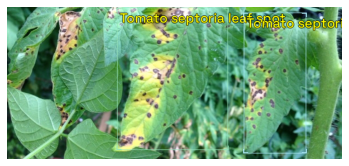

In [ ]:
show_record(train_records[0] , font_size=24 , label_color='#ffff00')

In [ ]:
train_records[1]

BaseRecord

common: 
	- Filepath: TRAIN/tomato-vine-ripe-leaves-isolated-against-white-34863029.jpg
	- Img: None
	- Image size ImgSize(width=953, height=1300)
	- Record ID: tomato-vine-ripe-leaves-isolated-against-white-34863029
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Bell_pepper leaf spot': 1, 'Potato leaf early blight': 2, 'Strawberry leaf': 3, 'grape leaf': 4, 'grape leaf black rot': 5, 'Tomato leaf': 6, 'Bell_pepper leaf': 7, 'Potato leaf': 8, 'Peach leaf': 9, 'Corn leaf blight': 10, 'Apple Scab Leaf': 11, 'Cherry leaf': 12, 'Tomato leaf bacterial spot': 13, 'Tomato leaf yellow virus': 14, 'Corn Gray leaf spot': 15, 'Apple rust leaf': 16, 'Raspberry leaf': 17, 'Blueberry leaf': 18, 'Squash Powdery mildew leaf': 19, 'Tomato mold leaf': 20, 'Tomato Early blight leaf': 21, 'Tomato leaf late blight': 22, 'Tomato Septoria leaf spot': 23, 'Tomato leaf mosaic virus': 24, 'Potato leaf late blight': 25, 'Apple leaf': 26, 'Corn rust leaf': 27, 'Soyabean leaf': 28, 'Tomato two

In [ ]:
###Method 2 - Creating a custom Parser

template_record =ObjectDetectionRecord()

In [ ]:
# a gen template
Parser.generate_template(template_record)


class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_filepath(<Union[str, Path]>)
        record.set_img_size(<ImgSize>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)
        record.detection.add_bboxes(<Sequence[BBox]>)


In [ ]:
!ls


LICENSE.txt			   README.md  test_labels.csv  train_labels.csv
PlantDoc-Object-Detection-Dataset  TEST       TRAIN


In [ ]:
data_dir =Path(".")

In [ ]:
from torch.utils import data
class PlantDocParser(Parser):
  def __init__(self,template_record,data_dir):
    super().__init__(template_record=template_record)

    self.data_dir =data_dir
    self.df=pd.read_csv(data_dir/"train_labels.csv")
    self.df.rename(columns={'class':'label'},inplace=True)
    self.class_map=ClassMap(list(self.df['label'].unique()))



  def __iter__(self)-> Any:
      for o in self.df.itertuples():
        yield o
      

  def __len(self)->int:
      return len(self.df)

  def record_id(self,o)-> Hashable:
      return o.filename

  def parse_fields(self,o,record,is_new):
      if is_new:
        filepath=self.data_dir/'TRAIN'/o.filename
        record.set_filepath(filepath)
        if filepath.exists():
          image_size=get_img_size(filepath)
          record.set_img_size(image_size)
        record.detection.set_class_map(self.class_map)

      record.detection.add_bboxes([BBox.from_xyxy(o.xmin,o.ymin,o.xmax,o.ymax)])
      record.detection.add_labels([o.label])


In [ ]:
parser_csv=PlantDocParser(template_record,data_dir)

train_records_csv, valid_records_csv=parser_csv.parse()

0it [00:00, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/2345 [00:00<?, ?it/s]

WARNING  - (record_id: NCLB.jpg) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/NCLB.jpg' does not exist | icevision.core.record:autofix_records:104
WARNING  - (record_id: early-blight-1.jpg) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.core.record:autofix_records:104
AUTOFIX-SUCCESS - (record_id: LB_potato_leaf_topside.jpg) - Clipping bbox xmax from 2354 to image width 2000 (Before: <BBox (xmin:738, ymin:610, xmax:2354, ymax:1679)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: NoCornLeafBlight13b.jpg) - Clipping bbox xmax from 2409 to image width 1944 (Before: <BBox (xmin:321, ymin:731, xmax:2409, ymax:1613)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: NoCornLeafBlight13b.jpg) - Clipping bbox xmax from 1961 to image width 1944 (Before: <BBox (xmin:221, ymin:117, xmax:1961, ymax:879)>) | icevision.utils.logger_utils:aut

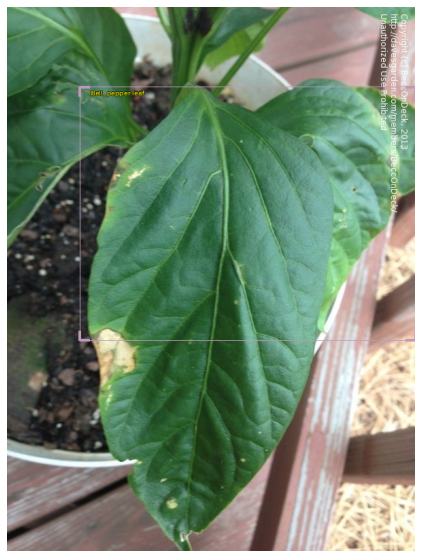

In [ ]:
show_record(train_records_csv[0],figsize=(10,10),font_size=10,label_color='#ffff00')

In [ ]:
train_records_csv[0]

BaseRecord

common: 
	- Filepath: TRAIN/387502.jpg
	- Img: None
	- Record ID: 387502.jpg
	- Image size ImgSize(width=600, height=800)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, 'Bell_pepper leaf spot': 25, 'Bell_pepper leaf': 26, 'grape leaf black rot': 27, 'Potato leaf': 28, 'Tomato two spotted spider mites leaf': 29}>
	- Labels: [26]
	- BBoxes: [<BBox (xmin:107, ymin:117, xmax:6

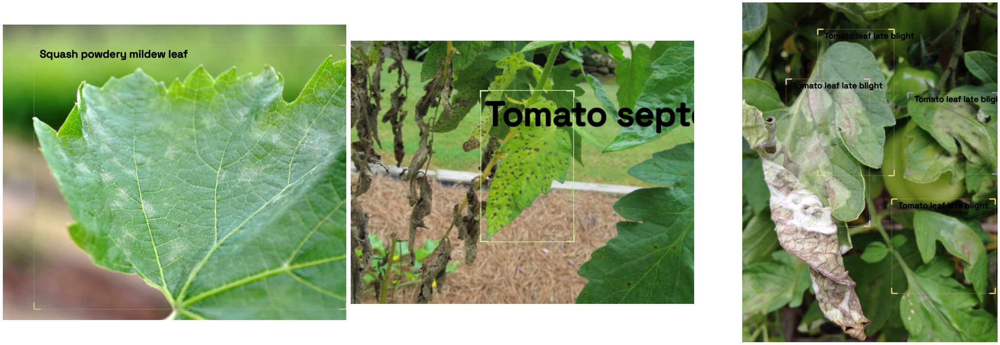

In [ ]:
show_records(train_records_csv[4:7],ncols=3,font_size=50,label_color='#000000')

In [ ]:
presize = 512

image_size = 384
train_tfms = tfms.A.Adapter ([*tfms.A.aug_tfms (size=image_size, presize=presize), tfms.A.Normalize ()])
valid_tfms = tfms.A.Adapter ([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize ()])



In [ ]:
train_ds = Dataset (train_records_csv, train_tfms)
valid_ds = Dataset (valid_records_csv, valid_tfms)



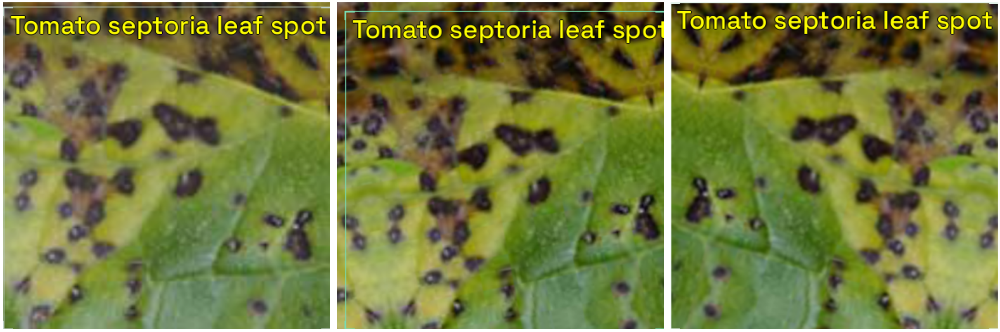

In [ ]:
samples = [train_ds[1] for _ in range (3)]
show_samples(samples, ncols=3, font_size=30, label_color = '#ffff00')

In [ ]:
#Model

selection=3

extra_args = {}

model_type=models.ultralytics.yolov5
backbone = model_type.backbones.small
#The yolov5 model requires an img size parameter
extra_args['img_size'] = image_size
            
model = model_type.model (backbone=backbone (pretrained=True), num_classes=len (parser_csv.class_map), **extra_args)





  0%|          | 0.00/14.1M [00:00<?, ?B/s]

03/22/2022 12:51:38 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=29
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3  

03/22/2022 12:51:38 - INFO - yolov5.models.yolo -    17                -1  1     90880  yolov5.models.common.C3                 [256, 128, 1, False]          
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -    18                -1  1    147712  yolov5.models.common.Conv               [128, 128, 3, 2]              
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -    19          [-1, 14]  1         0  yolov5.models.common.Concat             [1]                           
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -    20                -1  1    296448  yolov5.models.common.C3                 [256, 256, 1, False]          
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -    21                -1  1    590336  yolov5.models.common.Conv               [256, 256, 3, 2]              
03/22/2022 12:51:38 - INFO - yolov5.models.yolo -    22          [-1, 10]  1         0  yolov5.models.common.Concat             [1]                           
03/22/2022 12:51:39 - INFO - yolov5.models.yol

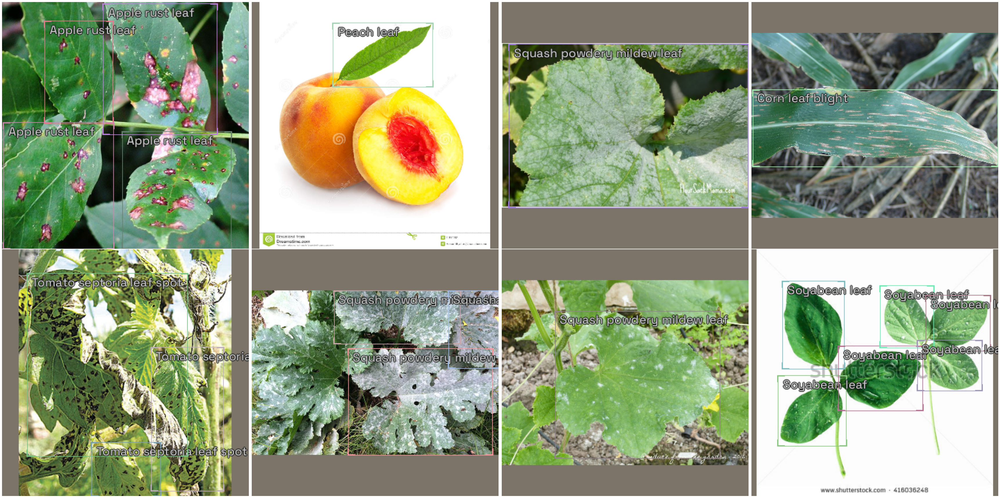

In [ ]:

train_dl = model_type.train_dl (train_ds, batch_size=8, num_workers=2, shuffle=True)
valid_dl = model_type.valid_dl (valid_ds, batch_size=8, num_workers=2, shuffle=False)
model_type.show_batch (first(valid_dl), ncols=4)

SuggestedLRs(valley=0.0030199517495930195)

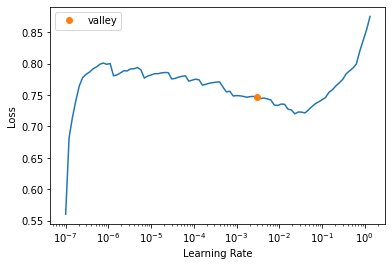

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
learn = model_type.fastai.learner (dls=[train_dl, valid_dl], model=model, metrics=metrics)
learn.lr_find ()

In [ ]:
learn.fine_tune (10, 2e-3, freeze_epochs=1)





epoch,train_loss,valid_loss,COCOMetric,time
0,0.558999,0.580286,0.015754,14:31


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


epoch,train_loss,valid_loss,COCOMetric,time
0,0.495804,0.501565,0.045392,18:29
1,0.448535,0.452327,0.057379,18:36
2,0.409860,0.425260,0.064216,18:27
3,0.400790,0.422881,0.079242,18:40
4,0.404041,0.388941,0.086624,18:44
5,0.369095,0.380659,0.114704,18:33
6,0.363874,0.366966,0.132317,18:43
7,0.349802,0.365355,0.137989,18:37
8,0.350620,0.356648,0.143500,18:34
9,0.338511,0.355896,0.150765,18:37


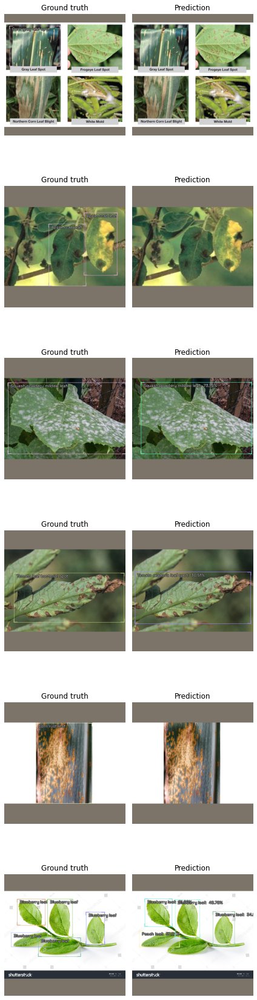

In [ ]:
model_type.show_results (model, valid_ds)

In [ ]:
!pip install mmcv

     |████████████████████████████████| 500 kB 5.1 MB/s 
     |████████████████████████████████| 190 kB 55.7 MB/s 
  Created wheel for mmcv: filename=mmcv-1.4.7-py2.py3-none-any.whl size=765992 sha256=4de93ed453e8bc3906478a61ac921bda2b726a2c47b0e1634ebba10c5dac2269
  Stored in directory: /root/.cache/pip/wheels/0a/09/7c/2fda88b3e03791b04a99e5cf77516f49167f81da7aa7866535
Successfully built mmcv


In [ ]:
from icevision.all import *
from mmcv.runner import (
    load_checkpoint,
    save_checkpoint,
    _load_checkpoint,
    load_state_dict,
)

checkpoint_path = '/content/drive/MyDrive/models/10_epoch.pth'

def save_icevision_checkpoint(
    model,
    filename,
    optimizer=None,
    meta=None,
    model_name=None,
    backbone_name=None,
    classes=None,
    img_size=None,
):
    """Save checkpoint to file.
    The checkpoint will have 3 fields: ``meta``, ``state_dict`` and
    ``optimizer``. By default ``meta`` will contain version and time info.
    Args:
        model (Module): Module whose params are to be saved.
        filename (str): Checkpoint filename.
        optimizer (:obj:`Optimizer`, optional): Optimizer to be saved.
        meta (dict, optional): Metadata to be saved in checkpoint.
    Examples:
        >>> save_icevision_checkpoint(model_saved,
                        model_name='mmdet.retinanet',
                        backbone_name='resnet50_fpn_1x',
                        class_map =  class_map,
                        img_size=img_size,
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})
    """

    if meta is None:
        meta = {}
    elif not isinstance(meta, dict):
        raise TypeError(f"meta must be a dict or None, but got {type(meta)}")

    if classes:
        meta.update(classes=classes)

    if model_name:
        meta.update(model_name=model_name)

    if img_size:
        meta.update(img_size=img_size)

    if backbone_name:
        meta.update(backbone_name=backbone_name)

    save_checkpoint(model, filename, optimizer=optimizer, meta=meta)

save_icevision_checkpoint(model, 
                        model_name='ultralytics.yolov5', 
                        backbone_name='small',
                        classes =  _CLASSES, 
                        img_size=384, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})


In [ ]:
def model_from_checkpoint(
    filename: Union[Path, str],
    model_name=None,
    backbone_name=None,
    classes=None,
    is_coco=False,
    img_size=None,
    map_location=None,
    strict=False,
    revise_keys=[
        (r"^module\.", ""),
    ],
    eval_mode=True,
    logger=None,
):
    """load checkpoint through URL scheme path.
    Args:
        filename (str): checkpoint file name with given prefix
        map_location (str, optional): Same as :func:`torch.load`.
            Default: None
    Returns:
        dict or OrderedDict: The loaded checkpoint.
    """

    if isinstance(filename, Path):
        filename = str(filename)

    checkpoint = _load_checkpoint(
        filename=filename, map_location=map_location, logger=logger
    )

    if is_coco and classes:
        err_msg = "`is_coco` cannot be set to True if `classes` is passed and `not None`. `classes` has priority. `is_coco` will be ignored."
        if logger is not None:
            logger.warning(err_msg)
        else:
            print(err_msg)

    if classes is None:
        if is_coco:
            classes = _CLASSES
        else:
            classes = checkpoint["meta"].get("classes", None)

    class_map = None
    if classes:
        class_map = ClassMap(classes)
        num_classes = len(class_map)

    if img_size is None:
        img_size = checkpoint["meta"].get("img_size", None)

    if model_name is None:
        model_name = checkpoint["meta"].get("model_name", None)

    model_type = None
    if model_name:
        model = model_name.split(".")
        # If model_name contains three or more components, the library and model are the second to last and last components, respectively (e.g. models.mmdet.retinanet)
        if len(model) >= 3:
            model_type = getattr(getattr(models, model[-2]), model[-1])
        # If model_name follows the default convention, the library and model are the first and second components, respectively (e.g. mmdet.retinanet)
        else:
            model_type = getattr(getattr(models, model[0]), model[1])

    if backbone_name is None:
        backbone_name = checkpoint["meta"].get("backbone_name", None)
    if model_type and backbone_name:
        backbone = getattr(model_type.backbones, backbone_name)

    extra_args = {}
    if img_size is None:
        img_size = checkpoint["meta"].get("img_size", None)

    models_with_img_size = ("yolov5", "efficientdet")
    # if 'efficientdet' in model_name:
    if (model_name) and (any(m in model_name for m in models_with_img_size)):
        extra_args["img_size"] = img_size

    # Instantiate model
    if model_type and backbone:
        model = model_type.model(
            backbone=backbone(pretrained=False), num_classes=num_classes, **extra_args
        )
    else:
        model = None

    # OrderedDict is a subclass of dict
    if not isinstance(checkpoint, dict):
        raise RuntimeError(f"No state_dict found in checkpoint file {filename}")
    # get state_dict from checkpoint
    if "state_dict" in checkpoint:
        state_dict = checkpoint["state_dict"]
    else:
        state_dict = checkpoint
    # strip prefix of state_dict
    for p, r in revise_keys:
        state_dict = {re.sub(p, r, k): v for k, v in state_dict.items()}

    # load state_dict
    if model:
        load_state_dict(model, state_dict, strict, logger)
    if eval_mode:
        model.eval()

    checkpoint_and_model = {
        "model": model,
        "model_type": model_type,
        "backbone": backbone,
        "class_map": class_map,
        "img_size": img_size,
        "checkpoint": checkpoint,
    }
    return checkpoint_and_model
    # return model, model_type, backbone, class_map, img_size, checkpoint


checkpoint_and_model = model_from_checkpoint(checkpoint_path)

03/22/2022 16:37:48 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=29
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3  

load checkpoint from local path: /content/drive/MyDrive/fyp/models/10_epoch.pth


03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     6                -1  3    625152  yolov5.models.common.C3                 [256, 256, 3]                 
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     7                -1  1   1180672  yolov5.models.common.Conv               [256, 512, 3, 2]              
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     8                -1  1   1182720  yolov5.models.common.C3                 [512, 512, 1]                 
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -     9                -1  1    656896  yolov5.models.common.SPPF               [512, 512, 5]                 
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -    10                -1  1    131584  yolov5.models.common.Conv               [512, 256, 1, 1]              
03/22/2022 16:37:48 - INFO - yolov5.models.yolo -    11                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
03/22/2022 16:37:48 - INFO - yolov5.models.yol

In [ ]:
# Just logging the info
model_type = checkpoint_and_model["model_type"]
backbone = checkpoint_and_model["backbone"]
class_map = checkpoint_and_model["class_map"]
img_size = checkpoint_and_model["img_size"]
model_type, backbone, class_map, img_size

(<module 'icevision.models.ultralytics.yolov5' from '/usr/local/lib/python3.7/dist-packages/icevision/models/ultralytics/yolov5/__init__.py'>,
 <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, 'Bell_pepper leaf spot': 25, 'Bell_pepper leaf': 26, 'grape leaf black rot': 27, 'Potato leaf': 28, 'Tomato two spotted spider mites leaf': 29}>,
 384)

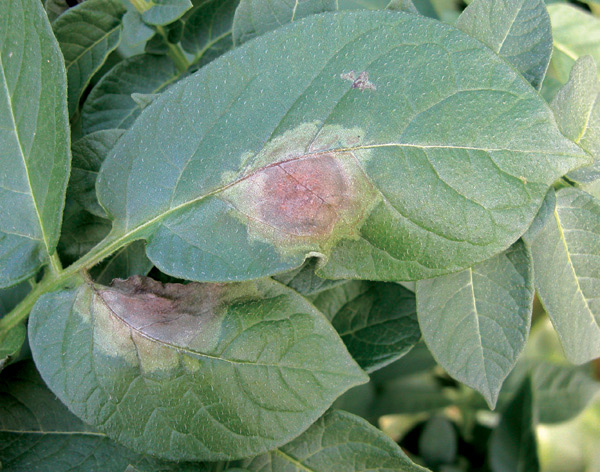

In [ ]:
##This cell is not showing boxes verify this once###
model = checkpoint_and_model["model"]

img_size = checkpoint_and_model["img_size"]
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])



img ='/content/PlantDoc-Object-Detection-Dataset/TRAIN/15hrt15a1f1.jpg'

pred_dict  = model_type.end2end_detect(img, valid_tfms, model, class_map=class_map, detection_threshold=0.5)
pred_dict['img']

  0%|          | 0/1 [00:00<?, ?it/s]

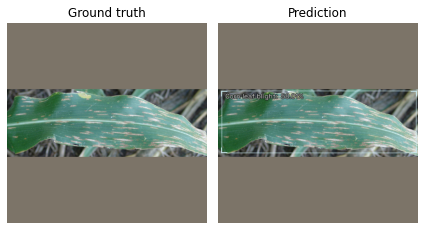

In [ ]:
##Batch ##
##This Cell giving correct###

imgs_array = [PIL.Image.open(Path('/content/PlantDoc-Object-Detection-Dataset/TEST/1321189.jpg'))]
infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map=class_map)


infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

show_preds(preds=preds[0:5])